<a href="https://colab.research.google.com/github/emanuel-gf/OBIA-open-notebooks/blob/main/OBIA_Emanuel_Goulart.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Object-Based Image Classification (OBIA)

Object-based image classification is a crucial approach for extracting meaningful information from scenes, offering advantages over pixel-based methods. It allows for the incorporation of spatial and contextual information.

The aim of this notebook is to apply a rule-based classification approach in order to create a scene composition, using open-source software tools. This method mimics human perception by segmenting images into objects, which can be analyzed using various attributes such as shape, texture, and spatial relationships.

**Given an image (RGB):**


<img src="https://drive.google.com/uc?export=viewd&id=1KolAGUsGGUTvmwPA_IKo7xam9_1fyFop" width="900">

 The goal is rebuild the classication with OBIA methods.
 ✨✨✨

To develop it , I started by partitioning the following steps:
  - Segmentation - 🥨
  - Feature Extraction - ⛺
  - Class Modelling - Rule-Based 🧩


In [ ]:
!pip install rasterio

### Import

In [7]:

import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage
import rasterio
import skimage as ski
from matplotlib import rcParams
from skimage import util
from skimage.segmentation import mark_boundaries, slic
from tqdm import tqdm

from scipy import stats
from skimage.color import label2rgb
from skimage.measure import regionprops, regionprops_table, perimeter
from skimage.segmentation import mark_boundaries, slic, watershed
from skimage.util import map_array
from sklearn.ensemble import RandomForestClassifier
from tqdm import tqdm


## Retrieve the image

In [8]:
# The image is being publicly shared as a .tif file.

import gdown
# .tif file being shared
file_id = "1-8Ss7FlvPOjfJxKMf5RdnlOD_8o8aiJn"

# Construct the download URL
url = f"https://drive.google.com/uc?id={file_id}"

# Download the file
output = "image_artificial_landscape.tif"  # Specify the output file name
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1-8Ss7FlvPOjfJxKMf5RdnlOD_8o8aiJn
To: /content/image_artificial_landscape.tif
100%|██████████| 27.0M/27.0M [00:00<00:00, 202MB/s]


'image_artificial_landscape.tif'

In [10]:
# File path to the image
img_path = "image_artificial_landscape.tif"

# Read the image and extract the bands
with rasterio.open(img_path) as src:
    # Extract red, green, blue, and NIR bands, normalize to [0, 1]
    bands = src.read([1, 2, 3]).astype(float) / 255
    red, green, blue = bands

# Stack
rgb = np.stack([red, green, blue], axis=-1)


In [11]:
# Quick look at the Image profile
with rasterio.open(img_path) as dataset:
  print(dataset.profile)

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 3061, 'height': 2937, 'count': 3, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 33N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32633"]]'), 'transform': Affine(0.2000000000000038, 0.0, 353526.5003576122,
       0.0, -0.2000000000000038, 5309225.474260291), 'blockxsize': 3061, 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}


In [12]:
print('Image has a shape of: ',rgb.shape)
print('And a size of: ',rgb.size)

Image has a shape of:  (2937, 3061, 3)
And a size of:  26970471


# Segmentation

Segmentation is the core of object creation in OBIA methods. Many strategies and studies are dedicated to this area, and the library Scikit-image has compiled different algorithms to partition images into meaningful regions or boundaries.


[Scikit-image](https://scikit-image.org/docs/stable/api/skimage.segmentation.html)

In order to explore the available segmentation algorithms, I decided to run a few different approaches, trying to capture the mechanism behind each algorithm and fine-tuning the chosen one to create a scene classification.

### Functions

In [14]:
## plot functions in case
def plot2_rgb_segmentation(rgb,segments):
  # Create the figure with 3 subplots
  fig, axs = plt.subplots(ncols=3, figsize=(15, 5), constrained_layout=True)

  # Display the original RGB image
  axs[0].imshow(rgb)
  axs[0].set_title("Original RGB")

  # Display the RGB image with segmentation boundaries for 3000 segments
  axs[1].imshow(mark_boundaries(rgb, segments, color=(1, 0, 0), mode="thick"))
  axs[1].set_title(f"SLIC Segmentation Boundaries ({n_segments} segments)")

  # Display the mean RGB per segment
  axs[2].imshow(label2rgb(segments, rgb, kind='avg'))
  axs[2].set_title("Mean RGB per Segment")

  # Remove axis for all subplots
  for ax in axs:
      ax.set_axis_off()

  # Display the combined figure
  plt.show()

def plot_rgb(rgb):
  plt.figure(figsize=(12, 12))
  plt.imshow(rgb)
  plt.axis('off')  # Hide axes
  plt.show()

def display_image(image,zoom=1.0):
  plt.figure(figsize=(6, 6))
  plt.imshow(image, extent=[0, zoom * image.shape[1], 0, zoom * image.shape[0]])
  plt.axis('off')
  plt.show()

# Import the necessary module
import ipywidgets as widgets

# Create a ColorPicker widget
color_picker = widgets.ColorPicker(
    concise=False,
    description='Pick a color',
    value='blue',
    disabled=False
)

# Display the widget
display(color_picker)

# Access the selected color value
selected_color = color_picker.value
print(f"Selected color: {selected_color}")

ColorPicker(value='blue', description='Pick a color')

Selected color: blue


## Cluster-based segmentation

Simple Linear Iterative Clustering (SLIC)

SLIC is a segmentation algorithm that divides an image into compact, nearly uniform segments called superpixels. These superpixels are groups of pixels with similar color or intensity values, which generally align with the boundaries of objects in the image. SLIC is popular because it is efficient and produces visually coherent segments.

The two main key parameters are:
- Number of Superpixels: Controls how many segments are created in the image. Fewer superpixels result in larger segments, while more superpixels produce smaller, more detailed segments.
- Compactness: Adjusts the balance between color similarity and spatial proximity. Higher values produce more compact, evenly spaced superpixels, while lower values allow for more irregular shapes that better capture color variations

☝ Bingo, Let's explore more these two main parameters:
- Number of Superpixels

✋ ps. Numbers of supepixel is refering of the same concept as segments. Which is described in the library as n_segments.

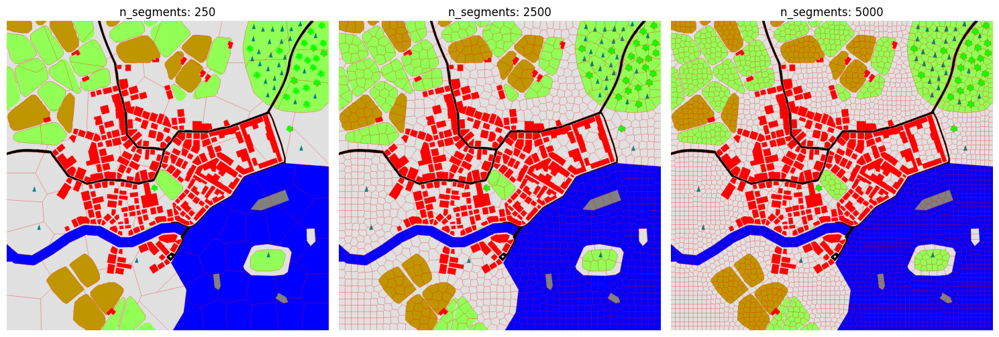

In [21]:
#### Number of superpixels
n_segments_list = [250,2500,5000]

# Create the figure for the subplots
fig, axs = plt.subplots(nrows=1, ncols=len(n_segments_list), figsize=(15, 5))

# Loop through different numbers of segments
for i, n_seg in enumerate(n_segments_list):
    slic_segments = slic(rgb, n_segments=n_seg, compactness=0.5, start_label=1)

    # Display RGB image with superpixel boundaries
    axs[i].imshow(mark_boundaries(rgb, slic_segments, color=(1, 0, 0), mode="thick"))
    axs[i].set_title(f'n_segments: {n_seg}')
    axs[i].axis('off')

plt.tight_layout()
plt.show()

It seems that more superpixels are a better approach to segment the image. I am going to explore the compacteness.

- Compacteness


A brief description at the [SLIC](https://scikit-image.org/docs/stable/api/skimage.segmentation.html#skimage.segmentation.slic) documentation from Scikit-image:
  "Higher values give more weight to space proximity, making superpixel shapes more square/cubic"


From observations of the results, changes in compactness affect the shape and structure of the superpixels. Given the image has a high number of superpixels, increasing the compactness value creates smaller objects in the 'Building Area' regions, and it appears to better maintain the shape structure of the targets.

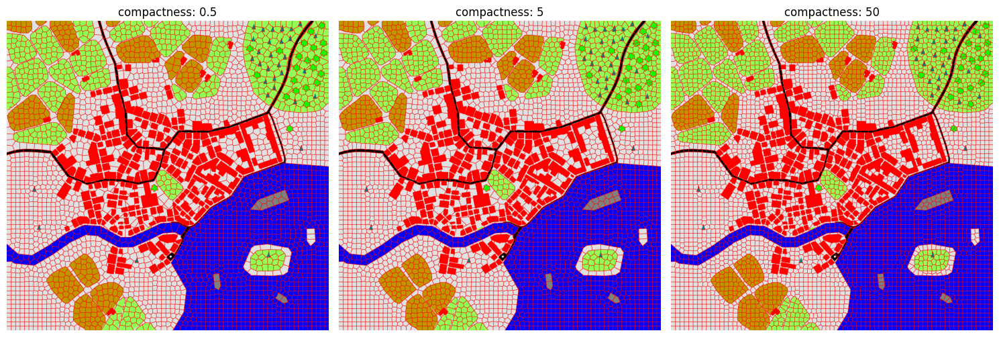

In [ ]:
# Fixed number of superpixels
n_segments = 1000

#### For degrees of compatecness
compactness_list = [0.5,5,50]

# Create the figure for the subplots
fig, axs = plt.subplots(nrows=1, ncols=len(compactness_list), figsize=(15, 5))

# Loop through different compactness values
for i, comp in enumerate(compactness_list):
    segments = slic(image, n_segments=n_segments, compactness=comp, start_label=1)
    axs[i].imshow(mark_boundaries(rgb, segments, color=(1, 0, 0), outline_color=(1, 0, 0), mode="thick"))
    axs[i].set_title(f'compactness: {comp}')
    axs[i].axis('off')

plt.tight_layout()
plt.show()

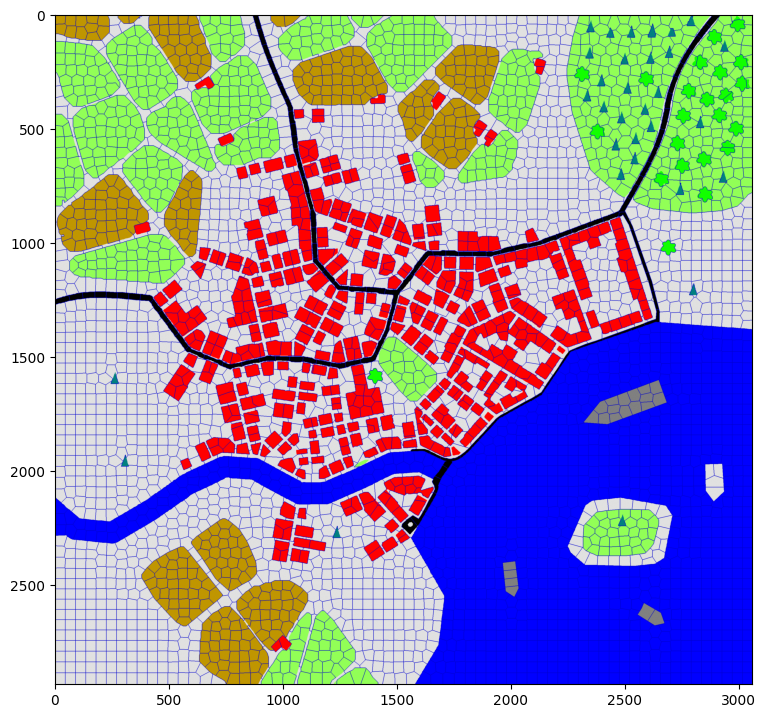

In [23]:
# With  a compacteness and segments choosen
compactness = 50
n_segments = 4500

# Generate segments using SLIC
slic_segments = slic(rgb, n_segments=n_segments, compactness=compactness, start_label=1)

#Visualizing
with plt.ion():
  plt.figure(figsize=(9,9))
  plt.imshow(mark_boundaries(rgb, slic_segments, color=(0,0,0.8), mode="thick"))


## Watershed Segmentation Algorithm

In the field of image processing, watershed is a segmentation algorithm  that enclouses an object by finding its local minima. It works by treating the gradient of an image as a topographic surface. Markers are placed within objects, and the algorithm "floods" the image from these markers. As the flooding progresses, boundaries between objects are formed where the waters meet, effectively segmenting the image into different regions.

[Watershed Transform Example](https://www.researchgate.net/publication/262985072/figure/fig2/AS:319719421825025@1453238458606/Two-examples-of-the-watershed-transform-applied-to-a-1-dimensional-signal-A-When.png)

### Filters

Reading the documentation of Scikit-image and the [community](https://forum.image.sc/t/is-it-possible-to-get-coordinates-for-segmentation-mask-generated-by-felzenszwalb-functions/78544/4) of skimage, I found interesting discussions regarding filters to detect edges, which facilitate the creation of segments from Watershed segmentation.

For the approach, I tested a few different kernels to see how they performed and also tested different parameters within each filter.

I also tested opening and closing filters to remove small brightest spots and to close gaps, reducing the pepper effect. The triangle filter seems to capture the edges of the objects well.

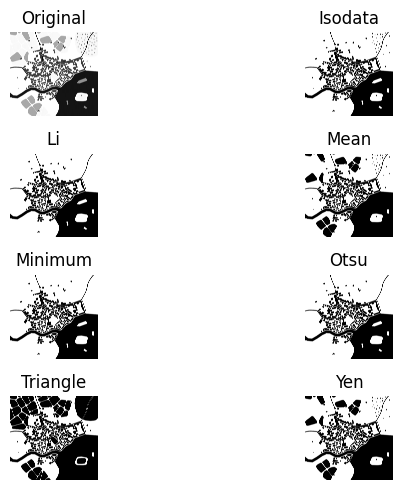

In [16]:
from skimage import filters

opened = skimage.morphology.opening(skimage.color.rgb2gray(rgb), skimage.morphology.disk(1))
closed = skimage.morphology.closing(opened, skimage.morphology.disk(1))

filters.try_all_threshold(closed, verbose=False)
plt.show()

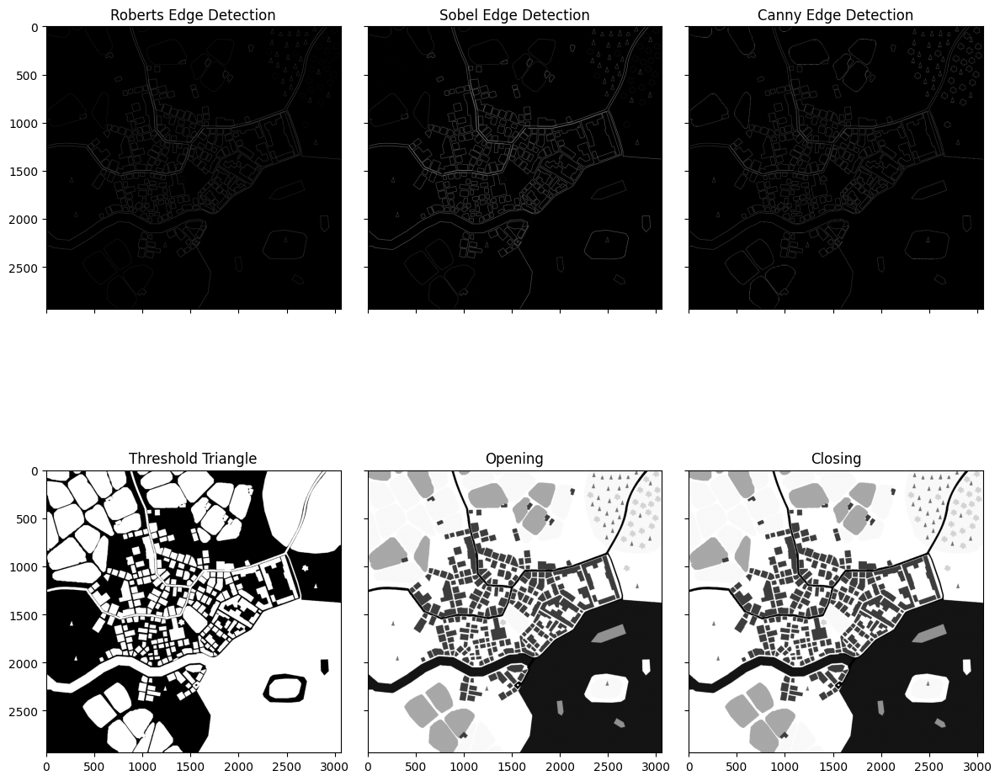

In [19]:
from skimage.filters import roberts, sobel
from skimage.feature import canny

## Applying filter kernels
edge_roberts = roberts(skimage.color.rgb2gray(rgb) #Roberts
                                       )
edge_sobel = sobel(skimage.color.rgb2gray(rgb), #Sobel
                                   )
canny = canny(skimage.color.rgb2gray(rgb), #Canny
              sigma=1
)

thrsehold_triangle = closed < filters.threshold_triangle(closed) # Threshold


# Displaying
fig, axes = plt.subplots(ncols=3,nrows=2, sharex=True, sharey=True, figsize=(12,12))

axes[0,0].imshow(edge_roberts, cmap=plt.cm.Greys_r)
axes[0,0].set_title('Roberts Edge Detection')

axes[0,1].imshow(edge_sobel, cmap=plt.cm.Greys_r)
axes[0,1].set_title('Sobel Edge Detection')

axes[0,2].imshow(canny, cmap=plt.cm.Greys_r)
axes[0,2].set_title('Canny Edge Detection')

axes[1,0].imshow(thrsehold_triangle, cmap=plt.cm.gray)
axes[1,0].set_title('Threshold Triangle')

axes[1,1].imshow(opened, cmap=plt.cm.gray)
axes[1,1].set_title('Opening')

axes[1,2].imshow(closed, cmap=plt.cm.gray)
axes[1,2].set_title('Closing')

plt.tight_layout()

Roberts, Canny, and Sobel filters seem to edge a few classes well. However, the meadows and pastures, particularly in the upper-left corner, are not recognized by the filters.

For the segmentation, I decided to explore the outputs from the filters. Additionally, I performed segmentation on the image without applying any filters, only transforming it to grayscale.

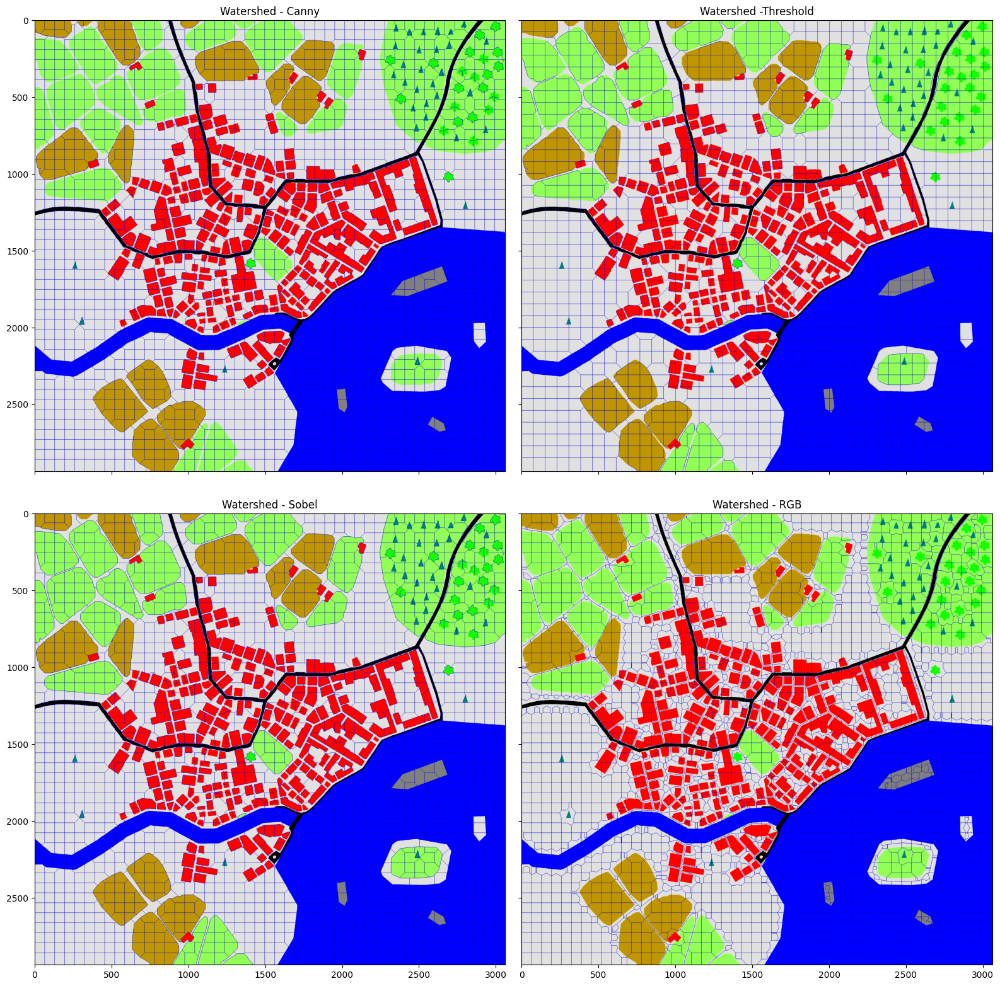

In [24]:
# Set the fixed parameters
#compactness = 0.000001
markers = 2100 ##desire number of Markers

## Apply filter in a gradient image
canny = skimage.feature.canny(skimage.color.rgb2gray(rgb))
sobel = skimage.filters.sobel(skimage.color.rgb2gray(rgb))
thrsehold_triangle = closed < filters.threshold_triangle(closed)

# Generate segments using Watershed
wth_canny_segments = watershed( canny,
                                markers=markers,
                                #compactness=compactness
                                )

wth_thre_segments = watershed(thrsehold_triangle,
                              markers= 1500,
                              compactness=0.0001
)

wth_sobel_segments = watershed(sobel,
                              markers= markers
)

wth_segments = watershed(skimage.color.rgb2gray(rgb),
                              markers= markers
)

# Displaying

fig, axes = plt.subplots(ncols=2,nrows=2, sharex=True, sharey=True, figsize=(16, 16))

axes[0,0].imshow(mark_boundaries(rgb, wth_canny_segments, color=(0,0,0.8), mode="thick"), cmap=plt.cm.Greys_r)
axes[0,0].set_title('Watershed - Canny')

axes[0,1].imshow(mark_boundaries(rgb, wth_thre_segments, color=(0,0,0.8), mode="thick"), cmap=plt.cm.Greys_r)
axes[0,1].set_title('Watershed -Threshold')

axes[1,0].imshow(mark_boundaries(rgb, wth_sobel_segments, color=(0,0,0.8), mode="thick"), cmap=plt.cm.Greys_r)
axes[1,0].set_title('Watershed - Sobel')

axes[1,1].imshow(mark_boundaries(rgb, wth_segments, color=(0,0,0.8), mode="thick"), cmap=plt.cm.Greys_r)
axes[1,1].set_title('Watershed - RGB')

plt.tight_layout()

## Felzenbag Algorithm

For the last segmented algorithm, I tried to use the Felzenbag.
Produces an oversegmentation of a multichannel (i.e. RGB) image using a fast, minimum spanning tree based clustering on the image grid.
RGB images, the algorithm uses the euclidean distance between pixels in color space.

Which seems segmented well the objects, so I decided to move on with it.

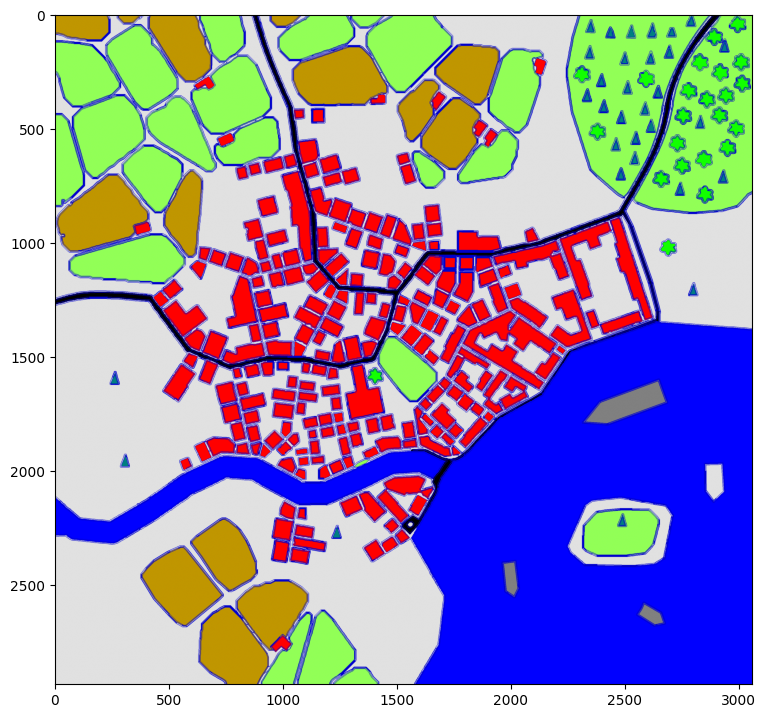

In [26]:
from skimage.segmentation import felzenszwalb

felz_segments = felzenszwalb(rgb,
                        scale=3.0,
                        sigma=0.95,
                        min_size=50)


#Visualizing
with plt.ion():
  plt.figure(figsize=(9,9))
  plt.imshow(mark_boundaries(rgb, felz_segments, color=(0,0,0.8), mode="thick"))

The next pice of code is dedicated to visualized better the polygons created.

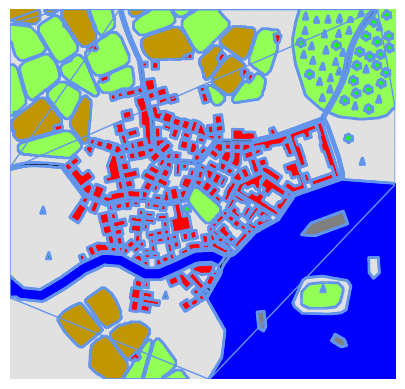

In [ ]:
from matplotlib import patches
contours = skimage.measure.find_contours(skimage.segmentation.find_boundaries(skimage.measure.label(felz_segments),
                                         mode='thick'))
## Vis
fig, ax = plt.subplots()
ax.imshow(rgb)
ax.set_axis_off()

for contour in contours:
    contour_xy = contour[:, [1, 0]]  # matplotlib uses xy coordinates, not row/col
    ax.add_patch(patches.Polygon(
            contour_xy,
            facecolor=(0, 0, 0, 0),
            edgecolor='cornflowerblue',
            #linewdith=1
            ))

### Comparison
Comparing the segmentation objects created from each algorithm.

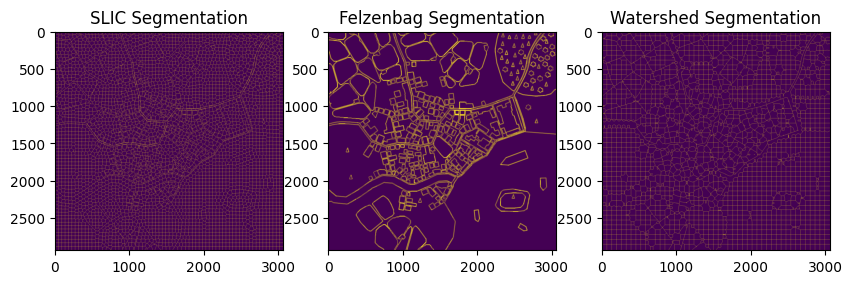

In [27]:
fig, axs = plt.subplots(1,3, figsize=(10,10))

axs[0].set_title('SLIC Segmentation')
axs[0].imshow(skimage.segmentation.find_boundaries(skimage.measure.label(slic_segments),
                                         mode='thick')
      )
axs[1].set_title('Felzenbag Segmentation')
axs[1].imshow(skimage.segmentation.find_boundaries(skimage.measure.label(felz_segments),
                                         mode='thick'))

axs[2].set_title('Watershed Segmentation')
axs[2].imshow(skimage.segmentation.find_boundaries(skimage.measure.label(wth_segments),
                                         mode='thick'))

I was quite satisfied with the Felzenbag algorithm and decided to move on.
The objects are well-segmentated, capturing even smaller pinus trees.
The next steps involve feature extraction and sampling modelling. ⚒

# Feature Extraction


For feature extraction and based in the segmented object created I decided to extract the following features:

Spectral Features
- Intensity Mean
- Standard Deviation

Shape Features
- Rectangularity
- Compactness
- Solidity
- Area
- Logaritmic of the Area

---------------------------------

☕ A few observations from the features extracted:

The std does not seem to extract meaningfull values in this specific image.

Applying a logaritmic scale in the Area was fundamental to deal with a broad range of values and brought meaninfull context in the rule-based.

Shape features contributes to distinguished objects man-made.

Spectral features are the gold if you know how to extract relevant aspects.


### Functions

In [ ]:
# Define custom features
def std(regionmask, intensity_img):
    vals = intensity_img[regionmask]
    std = np.std(vals)
    return std

def rectangularity(regionmask):
    return regionmask.sum()/regionmask.size

def compactness(regionmask):
    return 4*np.pi*regionmask.sum()/(perimeter(regionmask)**2 + 1e-6)  # small value added to avoid division by zero


# Calculate set of various features for each segment
def calc_all_feats(seg_arr, img_arr):
    spectral_feats = pd.DataFrame(
        regionprops_table(
            label_image = seg_arr,
            intensity_image = img_arr,
            properties = ["label", "intensity_mean"],
            extra_properties=(std,)
        )
    )
    shape_feats = pd.DataFrame(
        regionprops_table(
            label_image = seg_arr,
            properties = ["solidity","area","perimeter"],
            extra_properties=(rectangularity, compactness)
        )
    )

    #JOIN
    all_feats = pd.concat([spectral_feats, shape_feats], axis=1)

    return all_feats

### Processing

In [ ]:
all_feats_df = calc_all_feats(felz_segments, rgb)
all_feats_df = all_feats_df.rename(columns={'label': 'indx'})

## Create a new column
all_feats_df['log_area'] = np.log1p(all_feats_df['area'])


display(all_feats_df)

,indx,intensity_mean-0,intensity_mean-1,intensity_mean-2,std-0,std-1,std-2,solidity,area,perimeter,rectangularity,compactness,log_area
0,1,0.755359,0.593730,0.016484,1.752195e-02,3.982262e-02,1.194679e-01,0.059280,910.0,545.923882,0.034123,0.038370,6.814543
1,2,0.882353,0.882353,0.882353,2.220446e-16,2.220446e-16,2.220446e-16,0.055212,911.0,564.651804,0.031241,0.035906,6.815640
2,3,0.882353,0.882353,0.882353,2.220446e-16,2.220446e-16,2.220446e-16,0.161738,13904.0,1824.710858,0.105172,0.052476,9.540004
3,4,0.881997,0.881545,0.879929,6.773696e-03,1.539476e-02,4.618429e-02,0.177518,728.0,349.705627,0.138825,0.074806,6.591674
4,5,0.752941,0.588235,0.000000,0.000000e+00,1.110223e-16,0.000000e+00,0.081021,73.0,81.355339,0.030493,0.138599,4.304065
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2112,2113,0.011312,0.011312,0.998492,9.926430e-02,9.926430e-02,1.323524e-02,0.680233,234.0,141.888348,0.114035,0.146060,5.459586
2113,2114,0.753360,0.589187,0.002856,7.350056e-03,1.670467e-02,5.011402e-02,0.485849,309.0,190.793939,0.078030,0.106669,5.736572
2114,2115,0.882353,0.882353,0.882353,1.110223e-16,1.110223e-16,1.110223e-16,0.716667,215.0,130.059921,0.122927,0.159721,5.375278
2115,2116,0.572549,1.000000,0.341176,1.110223e-16,0.000000e+00,0.000000e+00,0.516667,217.0,132.888348,0.090417,0.154417,5.384495


##  Shape Features



### Solidity vs Compacteness

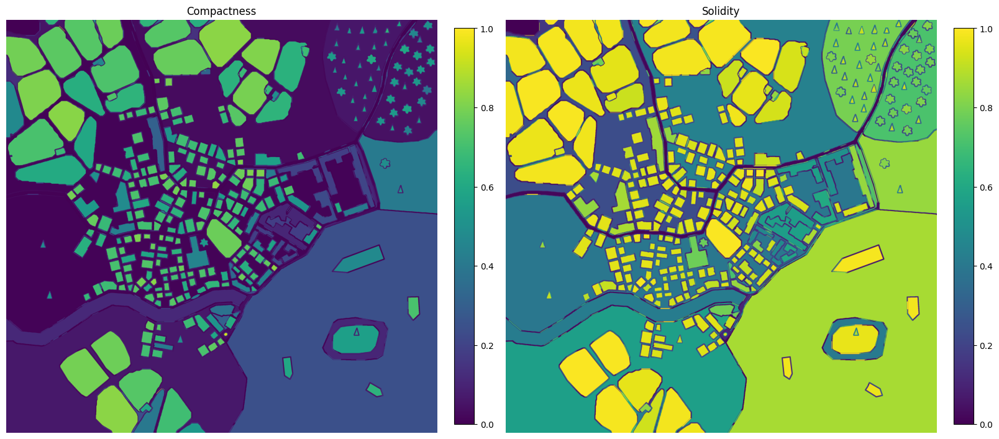

In [ ]:
# Map compactness and solidity values back to their corresponding segments in the image
mapped_compactness = map_array(felz_segments, np.array(all_feats_df["indx"]), np.array(all_feats_df["compactness"]))
mapped_solidity = map_array(felz_segments, np.array(all_feats_df["indx"]), np.array(all_feats_df["solidity"]))

#Display Original RGB, Compactness, and Solidity
fig, axs = plt.subplots(ncols=2, figsize=(16,16), constrained_layout=True)
im1=axs[0].imshow(mapped_compactness, vmin = 0,
                                      vmax= 1)

im2=axs[1].imshow(mapped_solidity, vmin = 0, vmax=1)
fig.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04)
fig.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04)

axs[0].set_title("Compactness")
axs[1].set_title("Solidity")

for ax in axs.flat:
    ax.set_axis_off();

# Show the plots
plt.show()


### Area vs Rectangularity

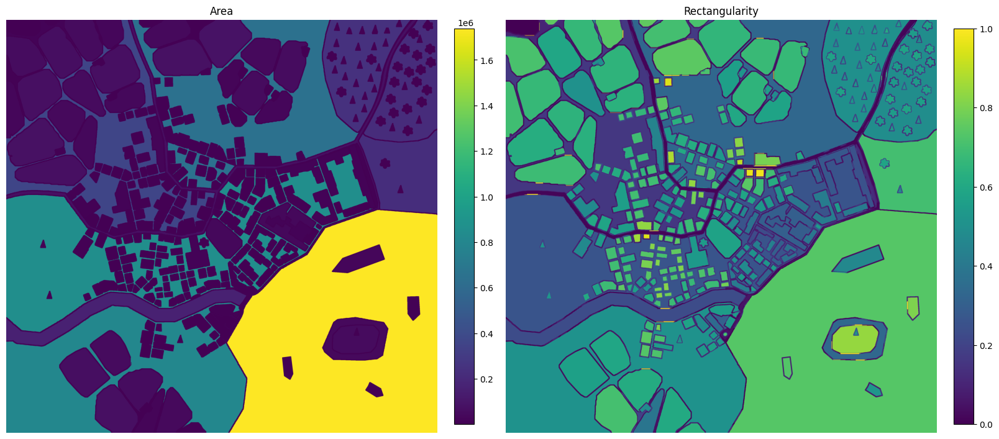

In [ ]:
# Map compactness and solidity values back to their corresponding segments in the image
mapped_area = map_array(felz_segments, np.array(all_feats_df["indx"]), np.array(all_feats_df["area"]))
mapped_log_area = map_array(felz_segments, np.array(all_feats_df["indx"]), np.array(all_feats_df["log_area"]))
mapped_rectangularity = map_array(felz_segments, np.array(all_feats_df["indx"]), np.array(all_feats_df["rectangularity"]))

#Display Original RGB, Compactness, and Solidity
fig, axs = plt.subplots(ncols=2, figsize=(16,16), constrained_layout=True)
im1=axs[0].imshow(mapped_area, vmin = int(all_feats_df['area'].min()),
                                      vmax= int(all_feats_df['area'].max()))
im2=axs[1].imshow(mapped_rectangularity, vmin = 0, vmax=1)
fig.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04)
fig.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04)

axs[0].set_title("Area")
axs[1].set_title("Rectangularity")

for ax in axs.flat:
    ax.set_axis_off();

# Show the plots
plt.show()


## Spectral Features

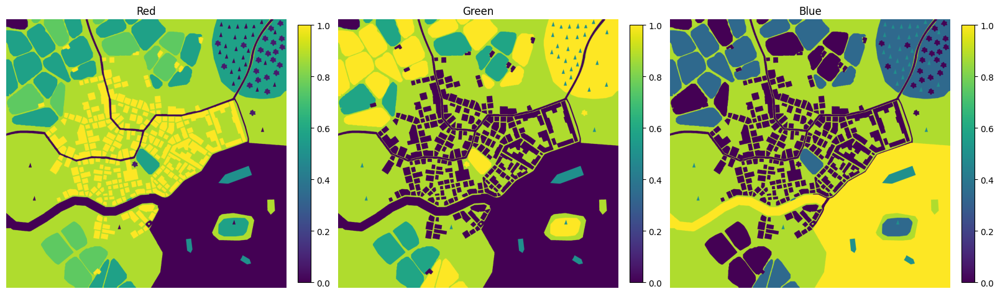

In [ ]:
# Mapping R intensity mean
mapped_mean_red = map_array(
    felz_segments,
    np.array(all_feats_df["indx"]),
    np.array(all_feats_df["intensity_mean-0"])
)

# Mapping Green intensity mean
mapped_mean_green = map_array(
    felz_segments,
    np.array(all_feats_df["indx"]),
    np.array(all_feats_df["intensity_mean-1"])
)

# Mapping Blue intensity mean
mapped_mean_blue = map_array(
    felz_segments,
    np.array(all_feats_df["indx"]),
    np.array(all_feats_df["intensity_mean-2"])
)

# Mapping Blue intensity mean
mapped_std_red = map_array(
    felz_segments,
    np.array(all_feats_df["indx"]),
    np.array(all_feats_df["std-0"])
)

## Plot
#Display R G B intensity
fig, axs = plt.subplots(ncols=3, figsize=(16,16), constrained_layout=True)
im1=axs[0].imshow(mapped_mean_red, vmin = 0,
                                      vmax= 1)
im2=axs[1].imshow(mapped_mean_green, vmin = 0, vmax=1)
im3=axs[2].imshow(mapped_mean_blue, vmin = 0, vmax=1)

fig.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04)
fig.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04)
fig.colorbar(im3, ax=axs[2], fraction=0.046, pad=0.04)

axs[0].set_title("Red")
axs[1].set_title("Green")
axs[2].set_title("Blue")

for ax in axs.flat:
    ax.set_axis_off();

# Show the plots
plt.show()


### Comparison - Side by side

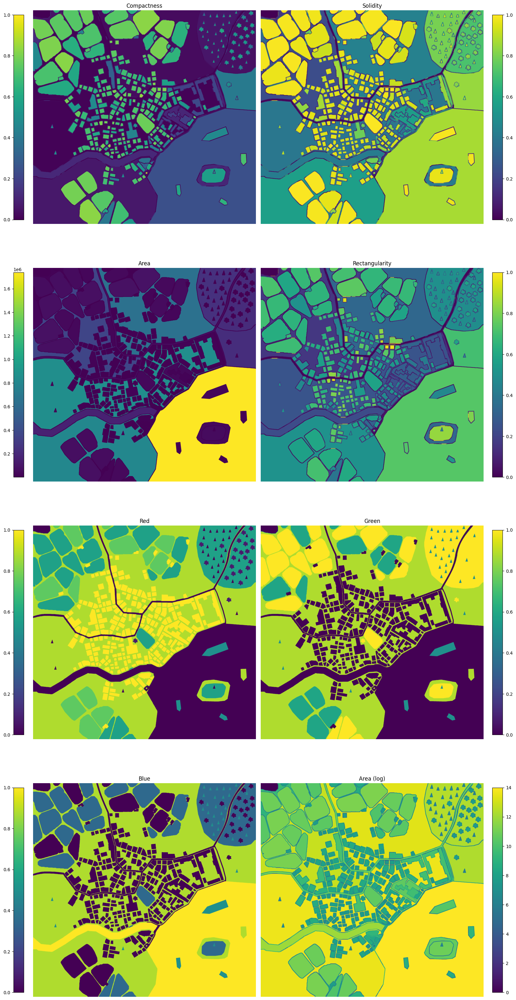

In [ ]:
import matplotlib.pyplot as plt

# Display Original RGB, Compactness, and Solidity
fig, axs = plt.subplots(ncols=2, nrows=4, figsize=(16, 32), constrained_layout=True)

# Plot images and store the returned image objects
im1 = axs[0, 0].imshow(mapped_compactness, vmin=0, vmax=1)  # Compactness
im2 = axs[0, 1].imshow(mapped_solidity, vmin=0, vmax=1)      # Solidity
im3 = axs[1, 0].imshow(mapped_area,
                        vmin=int(all_feats_df['area'].min()),
                        vmax=int(all_feats_df['area'].max())) # Area
im4 = axs[1, 1].imshow(mapped_rectangularity, vmin=0, vmax=1) # Rectangularity
im5 = axs[2, 0].imshow(mapped_mean_red, vmin=0, vmax=1)       # Red
im6 = axs[2, 1].imshow(mapped_mean_green, vmin=0, vmax=1)     # Green
im7 = axs[3, 0].imshow(mapped_mean_blue, vmin=0, vmax=1)      # Blue
im8 = axs[3, 1].imshow(mapped_log_area, vmin=0, vmax=14)         # STD Red

# Add colorbars
fig.colorbar(im1, ax=axs[0, 0], fraction=0.046, pad=0.04, location='left')   # Compactness
fig.colorbar(im2, ax=axs[0, 1], fraction=0.046, pad=0.04, location='right')  # Solidity
fig.colorbar(im3, ax=axs[1, 0], fraction=0.046, pad=0.04, location='left')   # Area
fig.colorbar(im4, ax=axs[1, 1], fraction=0.046, pad=0.04, location='right')  # Rectangularity
fig.colorbar(im5, ax=axs[2, 0], fraction=0.046, pad=0.04, location='left')   # Red
fig.colorbar(im6, ax=axs[2, 1], fraction=0.046, pad=0.04, location='right')  # Green
fig.colorbar(im7, ax=axs[3, 0], fraction=0.046, pad=0.04, location='left')   # Blue
fig.colorbar(im8, ax=axs[3, 1], fraction=0.046, pad=0.04, location='right')  # STD Red

# Set titles
axs[0, 0].set_title("Compactness")
axs[0, 1].set_title("Solidity")
axs[1, 0].set_title("Area")
axs[1, 1].set_title("Rectangularity")
axs[2, 0].set_title("Red")
axs[2, 1].set_title("Green")
axs[3, 0].set_title("Blue")
axs[3, 1].set_title("Area (log)")

# Turn off axis for all subplots
for ax in axs.flat:
    ax.set_axis_off()

# Show the plots
plt.show()

#Rule-Based

Since we are trying to classify the segment objects into homogeneous functionals regions, understanding what target classes should be assigned is fundamental:

*   Meadows
*   Croplands
*   Water
*   Non-Vegetated
*   Road
*   Deciduous Tree
*   Coniferus Tree

To accomplish this, I decided to classify at lower hierarchical levels in OBIA and then group them into higher hierarchical levels. For example, sub-level objects like 'sea' and 'river' are classified as 'water' at a higher level. Depending on the object, I was able to classify it at the higher hierarchical level.

However, as I tried to capture the features present in the objects, finding thresholds that delimit the target classes became clearer. In the end, I was able to directly capture the higher hierarchical object levels and decided to keep the rule-based knowledge at only one level of hierarchy to maintain simplicity for someone who is reading the code.


In [ ]:
## Rule-based

df_classes =pd.DataFrame()
df_classes['indx'] = all_feats_df['indx'].copy()

df_classes['water'] = ((all_feats_df["intensity_mean-2"] > 0.9)# &
                        # (all_feats_df["area"] > 1.4e6) & (all_feats_df["solidity"] > 0.8)
                         ).astype(int)

df_classes['meadow'] = ((all_feats_df["intensity_mean-0"] > 0.5) &
                        (all_feats_df["intensity_mean-0"] < 0.7) &
                        (all_feats_df["compactness"] > 0.5) &
                        (all_feats_df["area"] >0.2) &
                        (all_feats_df["log_area"] > 8.9)
                         ).astype(int)

df_classes['coniferus_tree'] = ((all_feats_df["intensity_mean-1"] > 0.4) &
                                (all_feats_df["intensity_mean-1"] < 0.8) &
                                (all_feats_df["log_area"] < 8.0) &
                                (all_feats_df["solidity"] > 0.8)
                                ).astype(int)

df_classes['buildings'] = ((all_feats_df["intensity_mean-1"] < 0.4) &
                                (all_feats_df["log_area"] < 10.0) &
                                (all_feats_df["solidity"] > 0.8)
                                ).astype(int)

df_classes['road'] =  ((all_feats_df["intensity_mean-0"] < 0.2) &
                                (all_feats_df["log_area"] > 8.5) &
                                (all_feats_df["solidity"] < 0.2)
                                ).astype(int)

df_classes['deciduous_tree'] =  ((all_feats_df["intensity_mean-2"] < 0.2) &
                                (all_feats_df["intensity_mean-0"] < 0.4) &
                                  (all_feats_df["intensity_mean-1"] > 0.4) &
                                (all_feats_df["solidity"] < 0.9)
                                ).astype(int)

df_classes['cropland'] =  ( (all_feats_df["intensity_mean-0"] > 0.6) &
                                (all_feats_df["intensity_mean-0"] < 0.8)# &
                              #    (all_feats_df["intensity_mean-1"] > 0.4) &
                              #  (all_feats_df["solidity"] < 0.9)
                                ).astype(int)

df_classes['non_vegetated'] = ((all_feats_df["intensity_mean-1"] < 0.9) &
                        (all_feats_df["intensity_mean-1"] > 0.4) &
                        (all_feats_df["intensity_mean-0"] > 0.2) &
                        (all_feats_df["rectangularity"] <0.6) &
                        (all_feats_df["compactness"] < 0.65)
).astype(int)

In [ ]:
### From dummies

# apply to each row a function that returns the class of each named region
def get_class(row):
    """
    This function determines the class based on the column values.
    It prioritizes classes in a specific order.
    """
    if row['non_vegetated'] == 1:
      return int(0)
    elif row['water'] == 1:
        return int(1)
    elif row['meadow'] == 1:
        return int(2)
    elif row['coniferus_tree'] == 1:
        return int(3)
    elif row['buildings'] == 1:
        return int(4)
    elif row['road'] == 1:
        return int(5)
    elif row['deciduous_tree'] == 1:
        return int(6)
    elif row['cropland'] == 1:
        return int(7)
    else:
        return int(-1)  # non-classified

# Apply the function to create a new 'class' column
df_classes['class'] = df_classes.apply(get_class, axis=1)

## Scene Composition

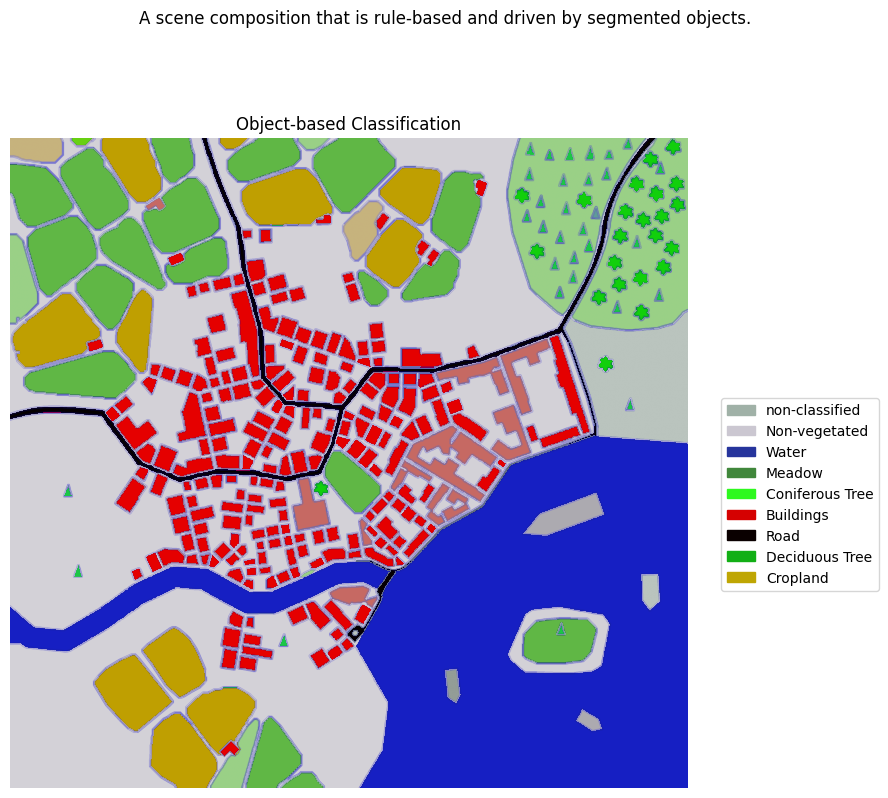

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors

# Map the predictions onto the original segmented image
mapped_rule_based_classification = map_array(
    felz_segments,
    np.array(df_classes["indx"]),
    np.array(df_classes["class"])
)

# Define the colors for each class
classes_c = ['#a0b1a7','#cbc7d1', '#26349c', '#40873b', '#2ef91f',
             '#d50101', '#0a0000', '#12af15', '#bfa603']

# Define class labels (replace with your actual class names)
class_labels = ['non-classified',\
    'Non-vegetated', 'Water', 'Meadow',
    'Coniferous Tree', 'Buildings', 'Road',
    'Deciduous Tree', 'Cropland'
]

# Create a ListedColormap
binary_cmap = mcolors.ListedColormap(classes_c)

# Plot the image with boundaries
plt.figure(figsize=(9, 9))
plt.imshow(mark_boundaries(rgb, felz_segments, color=(0, 0, 0.8), mode="thick"))

# Overlay the classification result
plt.imshow(mapped_rule_based_classification, cmap=binary_cmap, alpha=0.6, interpolation="nearest")

# Add titles
plt.title("Object-based Classification")
plt.suptitle("A scene composition that is rule-based and driven by segmented objects.")

# Create legend handles
legend_handles = [
    mpatches.Patch(color=color, label=label)
    for color, label in zip(classes_c, class_labels)
]

# Add legend to the plot
plt.legend(handles=legend_handles,
           bbox_to_anchor=(1.05, 0.6),
           loc='upper left',
           borderaxespad=0.)
plt.legend
# Turn off axis
plt.axis('off')

# Show the plot
plt.tight_layout()
plt.show()

ColorPicker(value='blue', description='Pick a color')

Selected color: blue


# Conclusion

Object-based image analysis foment an efficient and meaninfull method of thematic information extraction.

OBIA offers a
methodological framework for machine-based
interpretation of complex classes, defined by spectral,
spatial and structural as well as hierarchical properties

Unlike pixel-based methods that work with low-level features carrying little semantic meaning, OBIA allows for the incorporation of semantic information.

This shift towards an information-centered approach in image analysis moves beyond limitations of pixel-based methods and provide a more contextually framework,  able to incorporate onto hierarchical levels semantical context, formalizing a comprehensive framework for creating and analyzing composite scenes.  

# Refences and further readings:
 - T. Blanke et all - [Image Segmentation Methods for Object-based Analysis and Classification](https://link.springer.com/chapter/10.1007/978-1-4020-2560-0_12)

 - Lang, S., Albrecht, F., Kienberger, S., & Tiede, D. (2010).  [Object validity for operational tasks in a policy context](https://www.tandfonline.com/doi/full/10.1080/14498596.2010.487639)

- Drǎguţ, L., Tiede, D., & Levick, S. R. (2010).  [ESP: a tool to estimate scale parameter for multiresolution image segmentation of remotely sensed data](https://www.tandfonline.com/doi/full/10.1080/13658810903174803)

- Tiede, Dirk & Hoffmann, Christian. (2006). . [Process oriented object-based algorithms for single tree detection using laser scanning](https://www.researchgate.net/publication/228851631_Process_oriented_object-based_algorithms_for_single_tree_detection_using_laser_scanning)


